<a href="https://colab.research.google.com/github/kimjaehwankimjaehwan/korea/blob/main/exercise_air_pollution_in_seoul_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Notes

These codes are originated from below kernels:

* https://www.kaggle.com/ramontanoeiro/seoul-air-pollution
* https://www.kaggle.com/seriousran/eda-ing
* https://www.kaggle.com/bappekim/visualizing-the-location-of-station-using-folium

Based on these, original code will be added more and more.

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Preparing data

### Import packages

In [3]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline
import seaborn as sns

### Load data

We can see the explanation of dataset in data description section.

In [4]:
df_summary = pd.read_csv('/content/drive/MyDrive/한국분석/air_pollution_in_seoul/AirPollutionSeoul/Measurement_summary.csv')  # A condensed dataset based on the below three data.
df_info = pd.read_csv('/content/drive/MyDrive/한국분석/air_pollution_in_seoul/AirPollutionSeoul/Original Data/Measurement_info.csv')  # Air pollution measurement information
df_item = pd.read_csv('/content/drive/MyDrive/한국분석/air_pollution_in_seoul/AirPollutionSeoul/Original Data/Measurement_item_info.csv')  #  Information on air pollution measurement items
df_station = pd.read_csv('/content/drive/MyDrive/한국분석/air_pollution_in_seoul/AirPollutionSeoul/Original Data/Measurement_station_info.csv')  # Information on air pollution instrument stations

In [5]:
df_summary.head()

,Measurement date,Station code,Address,Latitude,Longitude,SO2,NO2,O3,CO,PM10,PM2.5
0,2017-01-01 00:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,0.004,0.059,0.002,1.2,73.0,57.0
1,2017-01-01 01:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,0.004,0.058,0.002,1.2,71.0,59.0
2,2017-01-01 02:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,0.004,0.056,0.002,1.2,70.0,59.0
3,2017-01-01 03:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,0.004,0.056,0.002,1.2,70.0,58.0
4,2017-01-01 04:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,0.003,0.051,0.002,1.2,69.0,61.0


## Exploring data

### Inspecting columns

This data was measured every hour between 2017 and 2019 thus `Measurement date` column has `date` + `time` data.

It has to be splitted into date and time into separate columns to see daily data visualization.

In [6]:
date_time = df_summary['Measurement date'].str.split(' ', n=1, expand=True)
date_time.head()

,0,1
0,2017-01-01,00:00
1,2017-01-01,01:00
2,2017-01-01,02:00
3,2017-01-01,03:00
4,2017-01-01,04:00


In [7]:
df_summary['date'] = date_time[0]
df_summary['time'] = date_time[1]
df_summary = df_summary.drop(['Measurement date'], axis=1)
df_summary.head()

,Station code,Address,Latitude,Longitude,SO2,NO2,O3,CO,PM10,PM2.5,date,time
0,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,0.004,0.059,0.002,1.2,73.0,57.0,2017-01-01,00:00
1,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,0.004,0.058,0.002,1.2,71.0,59.0,2017-01-01,01:00
2,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,0.004,0.056,0.002,1.2,70.0,59.0,2017-01-01,02:00
3,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,0.004,0.056,0.002,1.2,70.0,58.0,2017-01-01,03:00
4,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,0.003,0.051,0.002,1.2,69.0,61.0,2017-01-01,04:00


The dataset is from 25 districts in Seoul.

As we saw above, `Station code`, `Address`, `Latitude` and `Longitude` columns explain for locations. We can check all of these columns have distinct 25 values.

In [8]:
# print(df_summary['Station code'].unique())
print("`Station code` column has {} distinct values".format(df_summary['Station code'].nunique()))

# print(df_summary['Address'].unique())
print("`Address` column has {} distinct values".format(df_summary['Address'].nunique()))

# print(df_summary['Latitude'].unique())
print("`Latitude` column has {} distinct values".format(df_summary['Latitude'].nunique()))

# print(df_summary['Longitude'].unique())
print("`Longitude` column has {} distinct values".format(df_summary['Longitude'].nunique()))

`Station code` column has 25 distinct values
`Address` column has 25 distinct values
`Latitude` column has 25 distinct values
`Longitude` column has 25 distinct values


### Measurement variables validation check

In [9]:
df_summary.describe()

,Station code,Latitude,Longitude,SO2,NO2,O3,CO,PM10,PM2.5
count,647511.000000,647511.000000,647511.000000,647511.000000,647511.000000,647511.000000,647511.000000,647511.000000,647511.000000
mean,113.000221,37.553484,126.989340,-0.001795,0.022519,0.017979,0.509197,43.708051,25.411995
std,7.211315,0.053273,0.078790,0.078832,0.115153,0.099308,0.405319,71.137342,43.924595
min,101.000000,37.452357,126.835151,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000
25%,107.000000,37.517528,126.927102,0.003000,0.016000,0.008000,0.300000,22.000000,11.000000
50%,113.000000,37.544962,127.004850,0.004000,0.025000,0.021000,0.500000,35.000000,19.000000
75%,119.000000,37.584848,127.047470,0.005000,0.038000,0.034000,0.600000,53.000000,31.000000
max,125.000000,37.658774,127.136792,3.736000,38.445000,33.600000,71.700000,3586.000000,6256.000000


We can see that there are some -1 values on thes pollutant columns, which should not be possible. This might be wrong reading fo the instrument used to measure pollutants. Or -1 value could means NA value.

We will search and drop them.

In [10]:
print('We have {} negative values for SO2'.format(df_summary['SO2'].loc[df_summary['SO2'] < 0].count()))
print('We have {} negative values for NO2'.format(df_summary['NO2'].loc[df_summary['NO2'] < 0].count()))
print('We have {} negative values for O3'.format(df_summary['O3'].loc[df_summary['O3'] < 0].count()))
print('We have {} negative values for CO'.format(df_summary['CO'].loc[df_summary['CO'] < 0].count()))
print('We have {} negative values for PM10'.format(df_summary['PM10'].loc[df_summary['PM10'] < 0].count()))
print('We have {} negative values for PM2.5'.format(df_summary['PM2.5'].loc[df_summary['PM2.5'] < 0].count()))

We have 3976 negative values for SO2
We have 3834 negative values for NO2
We have 4059 negative values for O3
We have 4036 negative values for CO
We have 3962 negative values for PM10
We have 3973 negative values for PM2.5


In [11]:
import plotly
import plotly.graph_objs as go
import plotly.offline as py
# import plotly.io as pio
# pio.renderers.default = 'colab'
plotly.offline.init_notebook_mode(connected=True)

In [12]:
#
to_drop = df_summary.loc[(df_summary['SO2']<0) | (df_summary['NO2']<0) | (df_summary['CO']<0) | (df_summary['O3']<0)]
print("Total number of to_drop records is {}".format(to_drop.shape[0]))
to_drop.head()

Total number of to_drop records is 4529


,Station code,Address,Latitude,Longitude,SO2,NO2,O3,CO,PM10,PM2.5,date,time
854,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,2017-02-05,14:00
855,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,2017-02-05,15:00
856,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,2017-02-05,16:00
857,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,2017-02-05,17:00
858,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,2017-02-05,18:00


We could suspect that something was wrong at the same day thus measurement had worng value.

In [13]:
# drop records which contains columns having negative value
df_summary.drop(to_drop.index, axis=0, inplace=True)

In [14]:
# Gas pollutants
# Sampling a single station data
sample_101 = df_summary.loc[df_summary['Station code'] == 101]
data = [go.Scatter(x=sample_101['date'],
                   y=sample_101['SO2']),
        go.Scatter(x=sample_101['date'],
                   y=sample_101['NO2']),
        go.Scatter(x=sample_101['date'],
                   y=sample_101['O3']),
        go.Scatter(x=sample_101['date'],
                   y=sample_101['CO'])]

layout = go.Layout(title='Gases Levels after dropping negative value (Sample - Station code: 101)',
                   yaxis={'title': 'Level (ppm)'},
                   xaxis={'title': 'Date'})

fig = go.Figure(data=data, layout=layout)

py.iplot(fig)

In [15]:
# check negative value drop result
gas_pollutants = df_summary[['SO2', 'NO2', 'O3', 'CO']]
gas_pollutants.apply(lambda x: x < 0).sum().sum()

0

In [16]:
# PM pollutatns
data = [go.Scatter(x=sample_101['date'],
                   y=sample_101['PM2.5']),
        go.Scatter(x=sample_101['date'],
                   y=sample_101['PM10'])]

layout = go.Layout(title='PM level (Sample - Station code: 101)',
                   yaxis={'title': 'Level (ppm)'},
                   xaxis={'title': 'Date'})

fig = go.Figure(data=data, layout=layout)

py.iplot(fig)

In [17]:
to_drop_PM = df_summary.loc[(df_summary['PM2.5']<0) | (df_summary['PM10']<0) |
                            (df_summary['PM2.5']==0) | (df_summary['PM10']==0)]
to_drop_PM.head()

,Station code,Address,Latitude,Longitude,SO2,NO2,O3,CO,PM10,PM2.5,date,time
2247,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,0.072,0.012,0.034,7.3,2.0,-1.0,2017-04-04,15:00
3255,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,0.000,0.000,0.000,0.0,0.0,0.0,2017-05-16,15:00
3467,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,0.000,0.000,0.000,0.0,0.0,0.0,2017-05-25,11:00
3953,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,0.000,0.000,0.000,0.0,0.0,0.0,2017-06-14,17:00
4142,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,0.000,0.000,0.000,0.0,0.0,0.0,2017-06-22,14:00


In [18]:
df_summary.drop(to_drop_PM.index, axis=0, inplace=True)

In [19]:
# check negative and zero value drop result
pm_pollutants = df_summary[['PM2.5', 'PM10']]
pm_pollutants.apply(lambda x: x <= 0).sum().sum()

0

### Plotting total data daily basis

In [20]:
df_seoul_daily = df_summary.groupby(['date'], as_index=False).agg({
    'SO2': 'mean', 'NO2': 'mean', 'O3': 'mean', 'CO': 'mean', 'PM10': 'mean', 'PM2.5': 'mean',
})
df_seoul_daily.head()

,date,SO2,NO2,O3,CO,PM10,PM2.5
0,2017-01-01,0.005302,0.046509,0.004152,0.985142,77.332220,56.869783
1,2017-01-02,0.005970,0.039572,0.016533,0.891568,110.532884,78.762226
2,2017-01-03,0.005641,0.042332,0.013264,0.769865,79.188552,51.959596
3,2017-01-04,0.005817,0.050734,0.008628,0.884590,55.244556,34.708543
4,2017-01-05,0.004798,0.035620,0.011401,0.659532,36.362876,22.244147


<Axes: xlabel='date'>

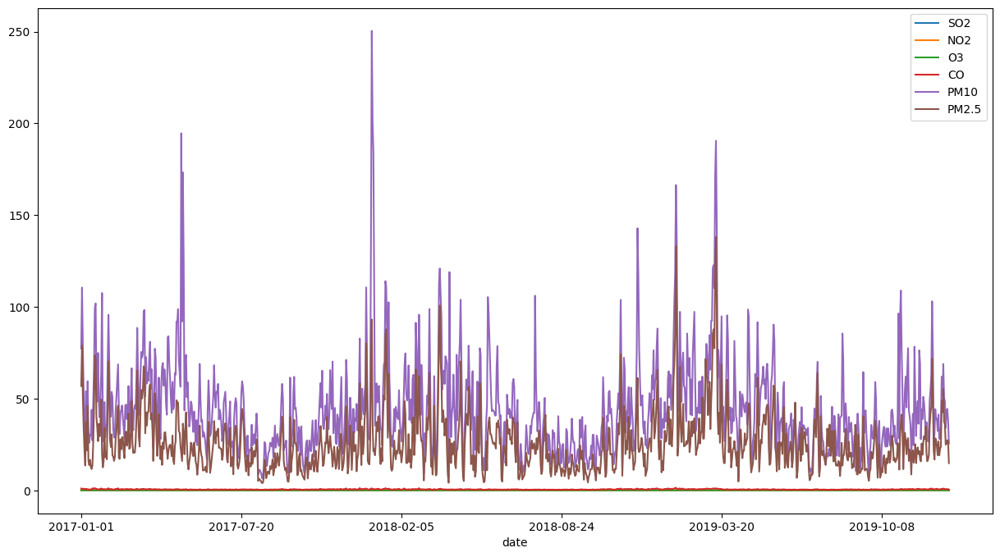

In [21]:
df_seoul_daily.plot(x='date', figsize=(15,8))

Daily mean value of all six pollutants are plotted in a single diagram.

As we can saw in `df_seoul_daily.head()`, scales of each pollutants are varying thus we could not see any other daily mean values other than `PM10` and `PM2.5`, which have large scales.

<Axes: xlabel='date'>

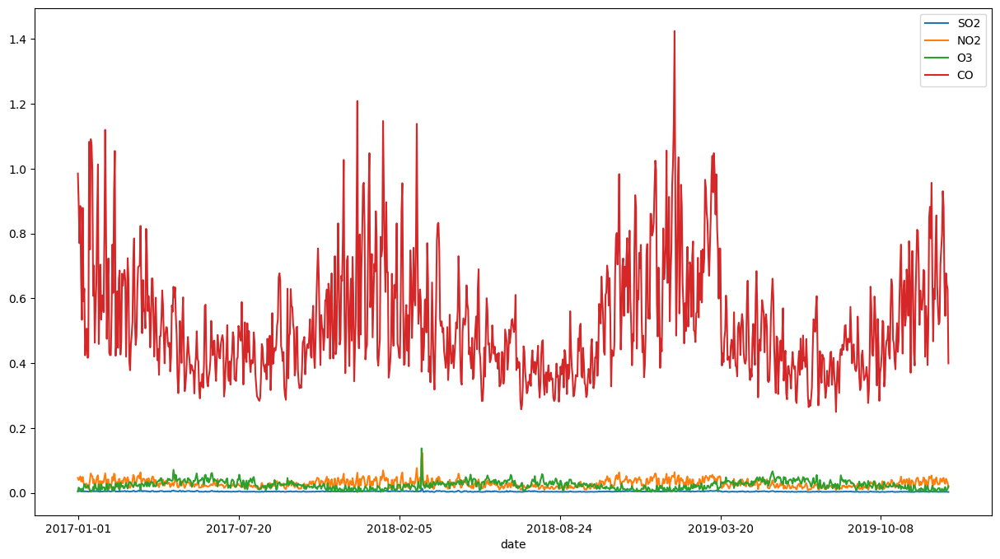

In [22]:
df_seoul_daily[['date', 'SO2', 'NO2', 'O3', 'CO']].plot(x='date', figsize=(15,8))

<Axes: xlabel='date'>

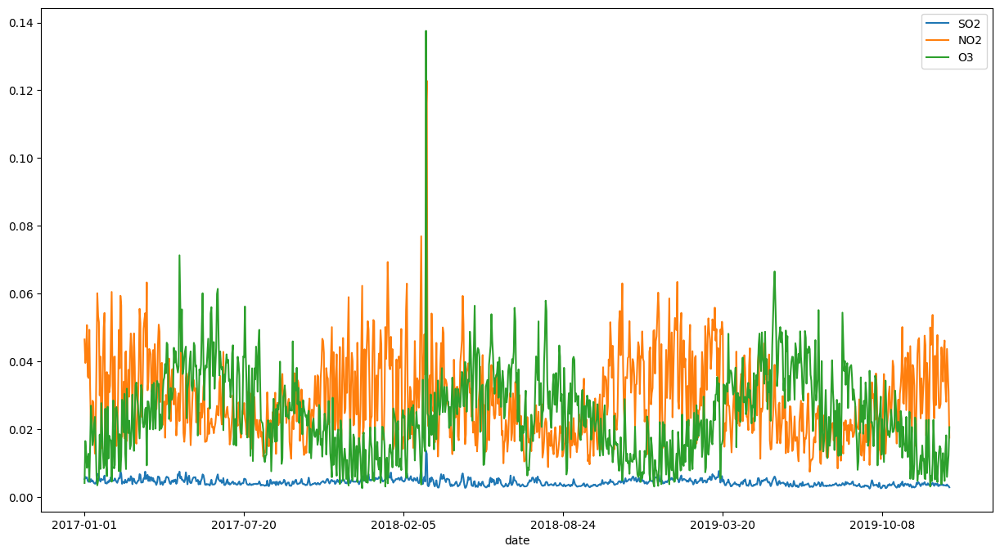

In [23]:
df_seoul_daily[['date', 'SO2', 'NO2', 'O3']].plot(x='date', figsize=(15,8))

### Correlations between pollutant variables

**NOTES for novice like me**

We want see how pollutant variavles are related each other(correlation analysis). But pollutant variables have different scales. It might be worry for standardization if we don't know what Pearson correlation coefficient means and is for.

**ρxy​=​Cov(x,y)​ / (σx​σy)** (Pearson correlation coefficient)

Correlation is normalized by standard deviation. Therefore, no need to normalize them.
By definition the correlation coefficient is independent of change of origin and scale. As such standardization will not alter the value of correlation.

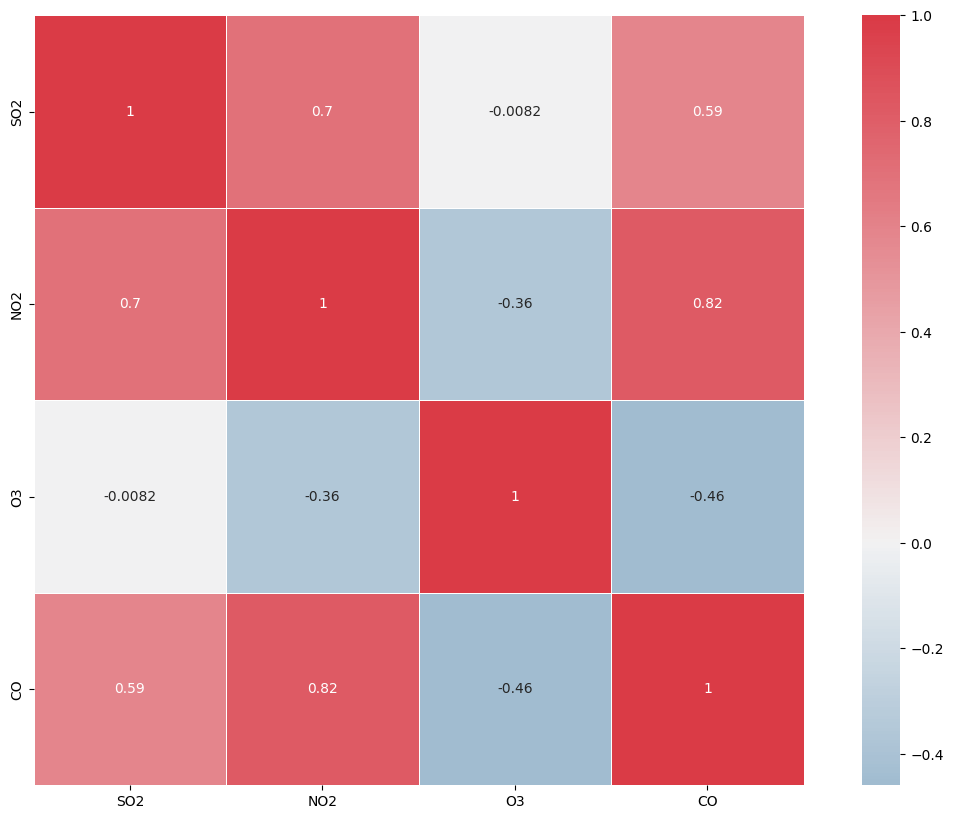

In [26]:
# Convert the 'date' column to datetime objects if it's not already
df_seoul_daily['date'] = pd.to_datetime(df_seoul_daily['date'])

# Extract numerical features for correlation analysis
numerical_features = ['SO2', 'NO2', 'O3', 'CO']
pollutant_corr = df_seoul_daily[numerical_features].corr()  # Pearson correlation

f, ax = plt.subplots(figsize=(15, 10))
cmap = sns.diverging_palette(240, 10, n=9, as_cmap=True)
sns.heatmap(pollutant_corr, cmap=cmap, annot=True, vmax=1, center=0,
            square=True, linewidth=.5)
plt.show()

There are highly related variables as follows:

* `SO2` and `NO2` (0.86)
* `SO2` and `O3` (0.84)
* `PM2.5` and `CO` (0.75)
* `PM2.5` and `PM10` (0.81)

### PM10 data (Particle Matter 10)

South Korea **PM10** enviornmental standards (daily mean)

* Good 0~30
* Not Bad ~80
* Bad ~150
* Very Bad 151~

In [27]:
df_item.head()

,Item code,Item name,Unit of measurement,Good(Blue),Normal(Green),Bad(Yellow),Very bad(Red)
0,1,SO2,ppm,0.02,0.05,0.15,1.0
1,3,NO2,ppm,0.03,0.06,0.20,2.0
2,5,CO,ppm,2.00,9.00,15.00,50.0
3,6,O3,ppm,0.03,0.09,0.15,0.5
4,8,PM10,Mircrogram/m3,30.00,80.00,150.00,600.0


In [28]:
df_seoul_daily.loc[df_seoul_daily['PM10'] <= 30, 'PM10_class'] = 0
df_seoul_daily.loc[(df_seoul_daily['PM10'] > 30) & (df_seoul_daily['PM10'] <= 80), 'PM10_class'] = 1
df_seoul_daily.loc[(df_seoul_daily['PM10'] > 80) & (df_seoul_daily['PM10'] <= 150), 'PM10_class'] = 2
df_seoul_daily.loc[(df_seoul_daily['PM10'] > 151), 'PM10_class'] = 3
df_seoul_daily['PM10_class'] = df_seoul_daily['PM10_class'].astype(int)
df_seoul_daily.head()

,date,SO2,NO2,O3,CO,PM10,PM2.5,PM10_class
0,2017-01-01,0.005302,0.046509,0.004152,0.985142,77.332220,56.869783,1
1,2017-01-02,0.005970,0.039572,0.016533,0.891568,110.532884,78.762226,2
2,2017-01-03,0.005641,0.042332,0.013264,0.769865,79.188552,51.959596,1
3,2017-01-04,0.005817,0.050734,0.008628,0.884590,55.244556,34.708543,1
4,2017-01-05,0.004798,0.035620,0.011401,0.659532,36.362876,22.244147,1


<ipython-input-29-40fc34aea520>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




<Axes: xlabel='PM10_class', ylabel='count'>

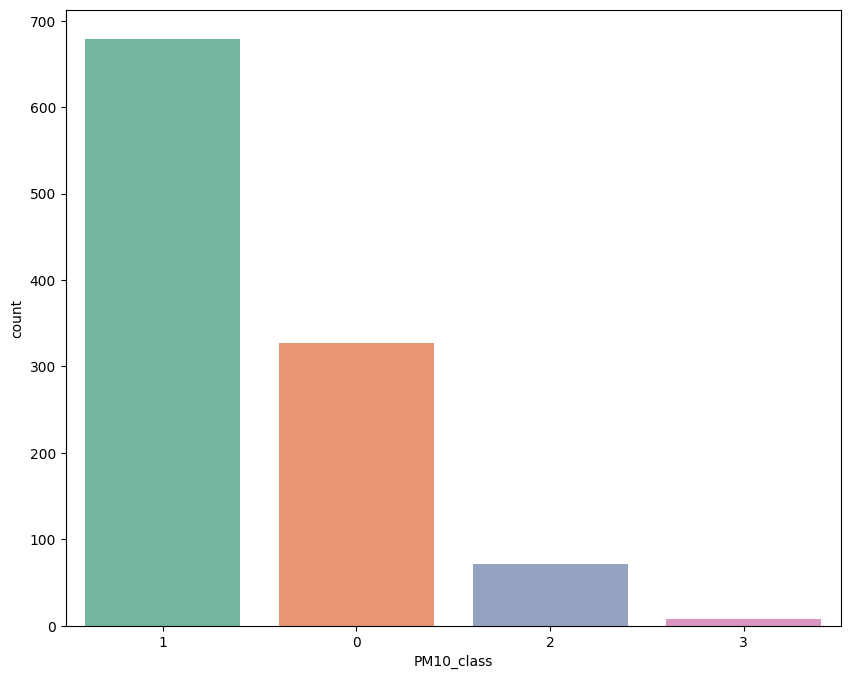

In [29]:
plt.figure(figsize=(10, 8))
sns.countplot(data=df_seoul_daily, x='PM10_class', order=df_seoul_daily['PM10_class'].value_counts().index,
              palette='Set2')

In [30]:
data = [go.Scatter(x=sample_101['date'],
                   y=sample_101['PM10'])]

layout = go.Layout(title='PM10 Levels (Sample - Station code: 101)',
                   xaxis={'title': 'Date'},
                   yaxis={'title': 'Level (ppm)'})

fig = go.Figure(data=data, layout=layout)

# `Good` horizontal line
fig.add_shape(
    type='line',
    x0='2017-01-01',
    y0=30,
    x1='2019-12-31',
    y1=30,
    line=dict(
        color='Green',
        width=5,
        dash='dashdot'
    )
)

# `Not Bad` horizontal line
fig.add_shape(
    type='line',
    x0='2017-01-01',
    y0=80,
    x1='2019-12-31',
    y1=80,
    line=dict(
        color='Yellow',
        width=5,
        dash='dashdot'
    )
)

py.iplot(fig)

### Location based exploration

TOP 5 average PM value

In [31]:
pm10_top5 = df_summary.groupby(by='Station code').agg({'PM10': 'mean'}).sort_values(by='PM10', ascending=False).head(5).reset_index()
pm10_top5_st_codes = pm10_top5['Station code'].tolist()
print('PM Top 5 station codes: {}'.format(pm10_top5_st_codes))
pm10_top5_district = df_station.set_index('Station code').loc[pm10_top5_st_codes].reset_index()['Station name(district)']
pm10_top5.insert(loc=1, column='Station name(district)', value=pm10_top5_district)
pm10_top5

PM Top 5 station codes: [116, 122, 117, 119, 107]


,Station code,Station name(district),PM10
0,116,Gangseo-gu,55.666864
1,122,Seocho-gu,54.354234
2,117,Guro-gu,51.938636
3,119,Yeongdeungpo-gu,50.645773
4,107,Seongdong-gu,49.992369


From 2017 to 2019, Top 5 districts for average PM10 are `Ganseo-gu`, `Seocho-gu`, `Guro-gu`, `Yeongdeungpo-gu` and `Seongdong-gu`.

<ipython-input-32-b58bb6142789>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




<Axes: xlabel='Station name(district)', ylabel='PM10'>

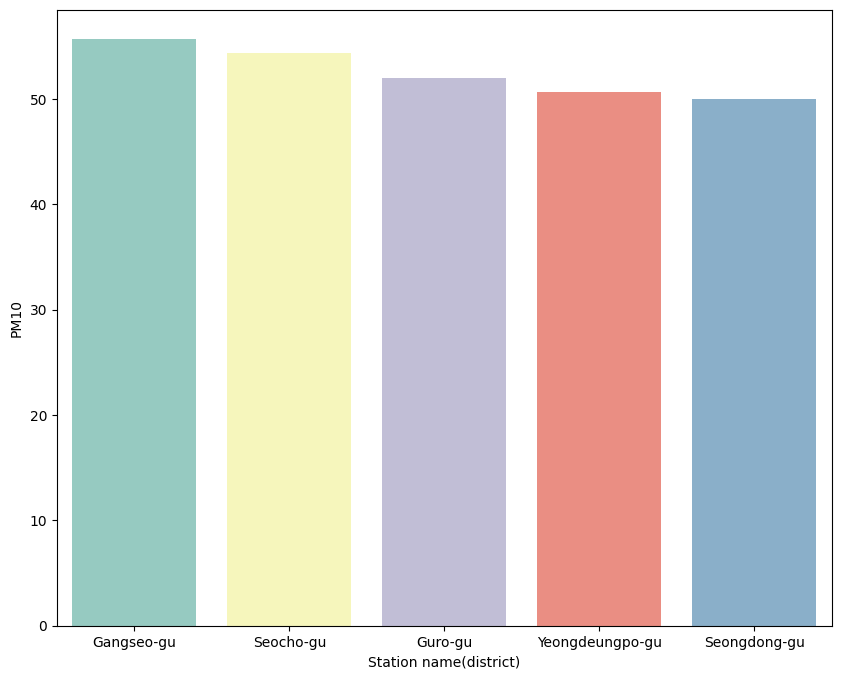

In [32]:
plt.figure(figsize=(10, 8))
sns.barplot(data=pm10_top5, x='Station name(district)', y='PM10', palette='Set3')

## Visualizing the location of station using polium

In [33]:
import requests
import folium
import json
import random

In [34]:
df_station.head()

,Station code,Station name(district),Address,Latitude,Longitude
0,101,Jongno-gu,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008
1,102,Jung-gu,"15, Deoksugung-gil, Jung-gu, Seoul, Republic o...",37.564263,126.974676
2,103,Yongsan-gu,"136, Hannam-daero, Yongsan-gu, Seoul, Republic...",37.540033,127.004850
3,104,Eunpyeong-gu,"215, Jinheung-ro, Eunpyeong-gu, Seoul, Republi...",37.609823,126.934848
4,105,Seodaemun-gu,"32, Segeomjeong-ro 4-gil, Seodaemun-gu, Seoul,...",37.593742,126.949679


In [35]:
center = [37.541, 126.986] # center of Seoul
m = folium.Map(location=center, zoom_start=11) # set map

# seoul district geo json
# https://raw.githubusercontent.com/southkorea/seoul-maps/master/kostat/2013/json/seoul_municipalities_geo.json

seoul_geo_url = 'https://raw.githubusercontent.com/southkorea/seoul-maps/master/kostat/2013/json/seoul_municipalities_geo.json'
resp = requests.get(seoul_geo_url)
seoul_geo = json.loads(resp.text)

# Add GeoJson to map
# GeoJson: info for representing polygon(district, borderline)
folium.GeoJson(
    seoul_geo,
    name='seoul_municipalities',
).add_to(m)

# Add marker


for i in df_station.index[:]:
  marker_popup_str = 'Station Name: ' + str(df_station.loc[i, 'Station name(district)'])
  folium.Marker(df_station.loc[i, ['Latitude', 'Longitude']],
                popup=marker_popup_str,
                icon=folium.Icon(color='black')).add_to(m)

m

/usr/local/lib/python3.10/dist-packages/folium/utilities.py:86: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/usr/local/lib/python3.10/dist-packages/folium/utilities.py:86: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/usr/local/lib/python3.10/dist-packages/folium/utilities.py:86: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/usr/local/lib/python3.10/dist-packages/folium/utilities.py:86: FutureWarning:

Series.__getitem__ treatin

In [36]:
df_item.head()

,Item code,Item name,Unit of measurement,Good(Blue),Normal(Green),Bad(Yellow),Very bad(Red)
0,1,SO2,ppm,0.02,0.05,0.15,1.0
1,3,NO2,ppm,0.03,0.06,0.20,2.0
2,5,CO,ppm,2.00,9.00,15.00,50.0
3,6,O3,ppm,0.03,0.09,0.15,0.5
4,8,PM10,Mircrogram/m3,30.00,80.00,150.00,600.0


In [37]:
def get_criteria(df_item, poll_item):
  critera = df_item[df_item['Item name'] == poll_item].iloc[0, 3:]
  return critera

def seoul_pollutant_map(df_day, df_item, poll_item):
  """ Visualize pollutant item status of each district by color marker """

  criteria = get_criteria(df_item, poll_item)

  df_day_c = df_day.copy()

  # set color of marker
  df_day_c['color'] = ''
  df_day_c.loc[df_day_c[poll_item] <= criteria[3], 'color'] = 'red'
  df_day_c.loc[df_day_c[poll_item] <= criteria[2], 'color'] = 'orange' # yellow
  df_day_c.loc[df_day_c[poll_item] <= criteria[1], 'color'] = 'green'
  df_day_c.loc[df_day_c[poll_item] <= criteria[0], 'color'] = 'blue'

  center = [37.541, 126.986] # center of Seoul
  m = folium.Map(location=center, zoom_start=11) # set map

  seoul_geo_url = 'https://raw.githubusercontent.com/southkorea/seoul-maps/master/kostat/2013/json/seoul_municipalities_geo.json'
  resp = requests.get(seoul_geo_url)
  seoul_geo = json.loads(resp.text)

  # Add GeoJson to map
  folium.GeoJson(
      seoul_geo,
      name='seoul_municipalities',
  ).add_to(m)

  for i in df_day_c.index:
    marker_popup_str = 'Station : ' + str(df_day_c.loc[i, 'Station code']) + ':' + str(df_day_c.loc[i, poll_item])
    folium.Marker(df_day_c.loc[i, ['Latitude', 'Longitude']],
                  popup=marker_popup_str,
                  icon=folium.Icon(color=df_day_c.loc[i, 'color'])).add_to(m)

  return m

In [38]:
random.seed(5)
ind = random.randint(1, len(df_summary))

day = df_summary.loc[ind, 'date']
print(day)
df_day = df_summary[df_summary['date'] == day]
seoul_pollutant_map(df_day, df_item, 'PM10')

2018-01-04


<ipython-input-37-763db8616d09>:14: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

<ipython-input-37-763db8616d09>:15: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

<ipython-input-37-763db8616d09>:16: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

<ipython-input-37-763db8616d09>:17: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consisten